## NEW generative script
IMP : This has to be merged with the previous one. Currently created to quickly generate all the different files.

NB : It was seen that running this with the previous code always crashes the kernel, but now it works.

In [1]:
# Import necessary libraries
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import copy
from datetime import datetime
from tqdm.notebook import tqdm
from IPython.display import display
import glob
import h5py

# Import custom modules
import src.data_loader as data_loader
import src.processor as processor

# Set matplotlib style
%matplotlib widget
%load_ext autoreload
%autoreload 2
plt.style.use('../anemotaxis.mplstyle')

In [2]:
def find_dates_in_base_path(base_path):
    """Find all date folders containing trx.mat files in the base path"""
    date_paths = []
    
    for root, dirs, files in os.walk(base_path):
        if "trx.mat" in files:
            date_str = os.path.basename(root)
            # Check if it's a date folder (format: YYYYMMDD_HHMMSS)
            if len(date_str) == 15 and date_str[8] == "_":
                date_paths.append({
                    'path': os.path.join(root, "trx.mat"),
                    'date_str': date_str
                })
    
    # Sort by date
    date_paths.sort(key=lambda x: x['date_str'])
    return date_paths

def process_single_date(trx_path, date_str):
    """Process a single date's tracking data"""
    print(f"Processing {date_str}...")
    
    # Process file
    date_str, extracted_data, metadata = data_loader.process_single_file(trx_path, show_progress=True)
    
    # Filter data
    filtered_data = processor.filter_larvae_by_duration(extracted_data, min_total_duration=300)
    filtered_data, stop_time_stats = processor.filter_larvae_by_excess_stop_time(
        filtered_data, max_stop_percentage=0.4
    )
    
    # Calculate behavior stats
    behavior_stats = processor.plot_behavior_duration_histograms(
        filtered_data, show_plot=False, using_frames=False
    )
    
    # Merge short stops
    merged_data, merge_summary = processor.merge_short_stop_sequences(
        filtered_data, behavior_stats,
        min_stop_duration_cast=3.0, min_stop_duration_run=3.0
    )
    
    print(f"  - {len(filtered_data)} larvae after filtering")
    print(f"  - {merge_summary['cast_stop_cast_count']} cast-stop-cast sequences merged")
    print(f"  - {merge_summary['run_stop_run_count']} run-stop-run sequences merged")
    
    return {
        'date_str': date_str,
        'raw_data': extracted_data,
        'filtered_data': filtered_data,
        'merged_data': merged_data,
        'behavior_stats': behavior_stats,
        'metadata': metadata
    }

def process_all_dates(base_path):
    """Process all date folders in the base path"""
    print(f"Finding date folders in {base_path}...")
    date_paths = find_dates_in_base_path(base_path)
    
    if not date_paths:
        print("No date folders with trx.mat found!")
        return None
    
    print(f"Found {len(date_paths)} dates with tracking data")
    
    # Process each date
    all_dates_data = {}
    for date_info in date_paths:
        date_str = date_info['date_str']
        trx_path = date_info['path']
        
        date_data = process_single_date(trx_path, date_str)
        all_dates_data[date_str] = date_data
    
    # Process all dates together
    print("\nProcessing all dates together...")
    all_data = data_loader.process_all_trx_files(base_path)
    
    # Filter and merge the combined data
    filtered_all_data = processor.filter_larvae_by_duration(all_data, min_total_duration=300)
    filtered_all_data, exp_stop_stats = processor.filter_larvae_by_excess_stop_time(
        filtered_all_data, max_stop_percentage=0.4
    )
    
    behavior_stats_all = processor.plot_behavior_duration_histograms(
        filtered_all_data, show_plot=False, using_frames=False
    )
    
    merged_all_data, merge_summary_all = processor.merge_short_stop_sequences(
        filtered_all_data, behavior_stats_all,
        min_stop_duration_cast=3.0, min_stop_duration_run=3.0
    )
    
    # Add combined data to the result
    all_dates_data['all_combined'] = {
        'date_str': 'All Combined',
        'raw_data': all_data,
        'filtered_data': filtered_all_data,
        'merged_data': merged_all_data,
        'behavior_stats': behavior_stats_all
    }
    
    return all_dates_data


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import copy
from scipy.ndimage import gaussian_filter1d
from src.processor import *  # Import the original functions

def analyze_run_orientations_all(experiments_data, bin_width=10, show_plot=True, ax=None, sigma=2):
    """Analyze run orientations with support for externally provided axes."""
    # Create axis if none provided
    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(8, 6))
        created_fig = True
    else:
        created_fig = False
    
    # Extract run orientations
    all_run_orientations = []
    
    # Check if the data is from a single experiment or multiple
    if isinstance(experiments_data, dict) and 'data' in experiments_data:
        data_to_process = experiments_data['data']
    else:
        data_to_process = experiments_data
    
    for larva_id, larva_data in data_to_process.items():
        try:
            # Make sure all arrays are properly flattened
            if 'global_state_large_state' in larva_data:
                states = np.array(larva_data['global_state_large_state']).flatten()
                runs = np.logical_or(states == 1, states == 0.5)
            else:
                continue  # Skip if no state data
                
            if runs.sum() == 0:
                continue  # Skip if no run frames
            
            # Get orientation data during runs
            if 'orientation_angle' in larva_data:
                orient = np.array(larva_data['orientation_angle']).flatten()
                # Check if arrays match length
                if len(orient) != len(runs):
                    print(f"Warning: Larva {larva_id} has mismatched array lengths - orientation: {len(orient)}, states: {len(runs)}")
                    # Use the shorter length
                    min_len = min(len(orient), len(runs))
                    orient = orient[:min_len]
                    runs = runs[:min_len]
                
                orientations = orient[runs]
                all_run_orientations.extend(orientations)
            else:
                # Calculate from head and tail positions
                x_head = np.array(larva_data['x_head']).flatten()
                y_head = np.array(larva_data['y_head']).flatten()
                x_tail = np.array(larva_data['x_tail']).flatten()
                y_tail = np.array(larva_data['y_tail']).flatten()
                
                # Check if arrays match length
                min_len = min(len(x_head), len(y_head), len(x_tail), len(y_tail), len(runs))
                if len(x_head) != len(runs) or len(y_head) != len(runs) or len(x_tail) != len(runs) or len(y_tail) != len(runs):
                    print(f"Warning: Larva {larva_id} has mismatched array lengths")
                    # Use the shorter length
                    x_head = x_head[:min_len]
                    y_head = y_head[:min_len]
                    x_tail = x_tail[:min_len]
                    y_tail = y_tail[:min_len]
                    runs = runs[:min_len]
                
                # Only use run frames
                x_head_run = x_head[runs]
                y_head_run = y_head[runs]
                x_tail_run = x_tail[runs]
                y_tail_run = y_tail[runs]
                
                # Calculate orientations
                dx = x_head_run - x_tail_run
                dy = y_head_run - y_tail_run
                orientations = np.degrees(np.arctan2(dy, -dx))
                all_run_orientations.extend(orientations)
        except Exception as e:
            print(f"Error processing larva {larva_id}: {str(e)}")
    
    # Create histogram
    if not all_run_orientations:
        ax.text(0.5, 0.5, "No run orientation data available", 
                ha='center', va='center', transform=ax.transAxes)
        return {'orientations': [], 'hist': np.array([]), 'bin_centers': np.array([])}
    
    bins = np.arange(-180, 181, bin_width)
    hist, bin_edges = np.histogram(all_run_orientations, bins=bins, density=True)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    
    # Apply Gaussian smoothing
    smoothed_hist = gaussian_filter1d(hist, sigma=sigma)
    
    # Plot on the specified axis with black line for runs
    ax.plot(bin_centers, smoothed_hist, color='black', linewidth=2)
    ax.set_xlabel('Orientation (°)')
    ax.set_ylabel('Probability Density')
    ax.set_xlim(-180, 180)
    ax.grid(True, alpha=0.3)
    
    # Add vertical lines
    ax.axvline(x=0, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-180, color='black', linestyle='--', alpha=0.5)
    
    if created_fig and show_plot:
        plt.tight_layout()
        plt.show()
    
    return {'orientations': all_run_orientations, 'hist': hist, 'bin_centers': bin_centers, 'smoothed_hist': smoothed_hist}

def analyze_cast_orientations_all_new(trx_data, show_plot=True, ax=None, sigma=2):
    """Analyze cast orientations with support for externally provided axes."""
    # Create axis if none provided
    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(8, 6))
        created_fig = True
    else:
        created_fig = False
    
    # Extract cast orientations
    all_cast_orientations = []
    
    # Check if the data is from a single experiment or multiple
    if 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data
    
    for larva_id, larva_data in data_to_process.items():
        try:
            # Make sure all arrays are properly flattened
            if 'global_state_large_state' in larva_data:
                states = np.array(larva_data['global_state_large_state']).flatten()
                casts = states == 2
            else:
                continue  # Skip if no state data
                
            if casts.sum() == 0:
                continue  # Skip if no cast frames
            
            # Get orientation data during casts
            if 'orientation_angle' in larva_data:
                orient = np.array(larva_data['orientation_angle']).flatten()
                # Check if arrays match length
                if len(orient) != len(casts):
                    print(f"Warning: Larva {larva_id} has mismatched array lengths - orientation: {len(orient)}, states: {len(casts)}")
                    # Use the shorter length
                    min_len = min(len(orient), len(casts))
                    orient = orient[:min_len]
                    casts = casts[:min_len]
                
                orientations = orient[casts]
                all_cast_orientations.extend(orientations)
            else:
                # Calculate from head and tail positions
                x_head = np.array(larva_data['x_head']).flatten()
                y_head = np.array(larva_data['y_head']).flatten()
                x_tail = np.array(larva_data['x_tail']).flatten()
                y_tail = np.array(larva_data['y_tail']).flatten()
                
                # Check if arrays match length
                min_len = min(len(x_head), len(y_head), len(x_tail), len(y_tail), len(casts))
                if len(x_head) != len(casts) or len(y_head) != len(casts) or len(x_tail) != len(casts) or len(y_tail) != len(casts):
                    print(f"Warning: Larva {larva_id} has mismatched array lengths")
                    # Use the shorter length
                    x_head = x_head[:min_len]
                    y_head = y_head[:min_len]
                    x_tail = x_tail[:min_len]
                    y_tail = y_tail[:min_len]
                    casts = casts[:min_len]
                
                # Only use cast frames
                x_head_cast = x_head[casts]
                y_head_cast = y_head[casts]
                x_tail_cast = x_tail[casts]
                y_tail_cast = y_tail[casts]
                
                # Calculate orientations
                dx = x_head_cast - x_tail_cast
                dy = y_head_cast - y_tail_cast
                orientations = np.degrees(np.arctan2(dy, dx))
                all_cast_orientations.extend(orientations)
        except Exception as e:
            print(f"Error processing larva {larva_id}: {str(e)}")
    
    # Create histogram
    if not all_cast_orientations:
        ax.text(0.5, 0.5, "No cast orientation data available", 
                ha='center', va='center', transform=ax.transAxes)
        return {'orientations': [], 'hist': np.array([]), 'bin_centers': np.array([])}
    
    bins = np.arange(-180, 181, 10)  # 10-degree bins
    hist, bin_edges = np.histogram(all_cast_orientations, bins=bins, density=True)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    
    # Apply Gaussian smoothing
    smoothed_hist = gaussian_filter1d(hist, sigma=sigma)
    
    # Plot on the specified axis with red line for casts
    ax.plot(bin_centers, smoothed_hist, color='red', linewidth=2)
    ax.set_xlabel('Orientation (°)')
    ax.set_ylabel('Probability Density')
    ax.set_xlim(-180, 180)
    ax.grid(True, alpha=0.3)
    
    # Add vertical lines at 0, 180, -180
    ax.axvline(x=0, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-180, color='black', linestyle='--', alpha=0.5)
    
    # Only show if we created our own figure and show_plot is True
    if created_fig and show_plot:
        plt.tight_layout()
        plt.show()
    
    return {
        'orientations': all_cast_orientations, 
        'hist': hist, 
        'bin_centers': bin_centers,
        'smoothed_hist': smoothed_hist
    }

def plot_global_behavior_matrix(trx_data, show_separate_totals=True, show_plot=True, ax=None):
    """
    Plot global behavior using the global state.
    
    This function visualizes behavioral states across time for all larvae.
    It processes both large_state (1-6) and small_large_state (0.5-5.5) values.
    
    Args:
        trx_data: Dictionary of larva data
        show_separate_totals: If True, show large, small, and total behaviors as separate rows
                             If False, show only a single row per larva
        show_plot: Whether to display the plot immediately
        ax: Optional matplotlib axes to plot on
    
    Returns:
        Behavior matrix or dict of processed data depending on mode
    """
    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.patches import Patch
    from matplotlib.lines import Line2D

    # Create axis if none provided
    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(12, 8))
        created_fig = True
    else:
        created_fig = False
    
    # Define state value mapping (both integer and half-integer values)
    # Maps state values to behavior names and colors
    state_mapping = {
        # Large behaviors (integer values)
        1.0: {'name': 'large_run', 'base': 'run', 'color': [0.0, 0.0, 0.0]},      # Black
        2.0: {'name': 'large_cast', 'base': 'cast', 'color': [1.0, 0.0, 0.0]},     # Red
        3.0: {'name': 'large_stop', 'base': 'stop', 'color': [0.0, 1.0, 0.0]},     # Green
        4.0: {'name': 'large_hunch', 'base': 'hunch', 'color': [0.0, 0.0, 1.0]},    # Blue
        5.0: {'name': 'large_backup', 'base': 'backup', 'color': [1.0, 0.5, 0.0]},   # Orange
        6.0: {'name': 'large_roll', 'base': 'roll', 'color': [0.5, 0.0, 0.5]},     # Purple
        
        # Small behaviors (half-integer values)
        0.5: {'name': 'small_run', 'base': 'run', 'color': [0.7, 0.7, 0.7]},      # Light gray
        1.5: {'name': 'small_cast', 'base': 'cast', 'color': [1.0, 0.7, 0.7]},     # Light red
        2.5: {'name': 'small_stop', 'base': 'stop', 'color': [0.7, 1.0, 0.7]},     # Light green
        3.5: {'name': 'small_hunch', 'base': 'hunch', 'color': [0.7, 0.7, 1.0]},    # Light blue
        4.5: {'name': 'small_backup', 'base': 'backup', 'color': [1.0, 0.8, 0.6]},   # Light orange
        5.5: {'name': 'small_roll', 'base': 'roll', 'color': [0.8, 0.6, 0.8]}      # Light purple
    }
    
    # Define total behavior colors (medium shade between large and small)
    total_behavior_colors = {
        'run': [0.4, 0.4, 0.4],       # Medium gray
        'cast': [0.8, 0.3, 0.3],      # Medium red
        'stop': [0.3, 0.8, 0.3],      # Medium green
        'hunch': [0.3, 0.3, 0.8],     # Medium blue
        'backup': [0.8, 0.6, 0.3],    # Medium orange
        'roll': [0.6, 0.3, 0.6]       # Medium purple
    }

    # Process larvae data
    if isinstance(trx_data, dict) and 'data' in trx_data:
        larvae_data = trx_data['data']
    else:
        larvae_data = trx_data
        
    larva_ids = sorted(larvae_data.keys())
    n_larvae = len(larva_ids)
    
    if n_larvae == 0:
        ax.text(0.5, 0.5, "No larvae data available", 
                ha='center', va='center', transform=ax.transAxes)
        return {}
    
    # Compute time ranges
    tmins = []
    tmaxs = []
    for lid in larva_ids:
        if 't' in larvae_data[lid] and len(larvae_data[lid]['t']) > 0:
            times = np.array(larvae_data[lid]['t']).flatten()
            if len(times) > 0:
                tmins.append(np.min(times))
                tmaxs.append(np.max(times))
    
    if not tmins:
        ax.text(0.5, 0.5, "No time data available", 
                ha='center', va='center', transform=ax.transAxes)
        return {}
    
    t_min = min(tmins)
    t_max = max(tmaxs)
    
    # Decide on plotting approach based on show_separate_totals
    if show_separate_totals:
        # Create full behavior matrix with colors (as in original function)
        resolution = 1000
        behavior_matrix = np.full((n_larvae * 3, resolution, 3), fill_value=1.0)  # white background
        
        # Process each larva
        for larva_idx, lid in enumerate(larva_ids):
            # Get time and state data
            if 't' not in larvae_data[lid] or len(larvae_data[lid]['t']) == 0:
                continue  # Skip larvae without required data
                
            larva_time = np.array(larvae_data[lid]['t']).flatten()
            
            # Use global_state_small_large_state if available, otherwise use global_state_large_state
            if 'global_state_small_large_state' in larvae_data[lid]:
                states = np.array(larvae_data[lid]['global_state_small_large_state']).flatten()
            elif 'global_state_large_state' in larvae_data[lid]:
                states = np.array(larvae_data[lid]['global_state_large_state']).flatten()
            else:
                continue  # Skip if no state data available
            
            # Ensure arrays have same length
            min_len = min(len(larva_time), len(states))
            if min_len == 0:
                continue
                
            larva_time = larva_time[:min_len]
            states = states[:min_len]
            
            # Convert times to indices
            time_indices = np.floor(
                ((larva_time - t_min) / (t_max - t_min) * (resolution - 1))
            ).astype(int)
            time_indices = np.clip(time_indices, 0, resolution - 1)

            # Arrays to store large, small and total behaviors
            large_behaviors = np.full((resolution, 3), fill_value=1.0)  # white background
            small_behaviors = np.full((resolution, 3), fill_value=1.0)  # white background
            total_behaviors = np.full((resolution, 3), fill_value=1.0)  # white background
            
            # For each unique time index, use the corresponding state
            unique_indices = np.unique(time_indices)
            for t_idx in unique_indices:
                mask = time_indices == t_idx
                if np.any(mask):
                    state_val = float(states[mask][0])  # Take first state if multiple exist
                    
                    # Round to nearest 0.5 to handle potential floating point issues
                    state_val = round(state_val * 2) / 2
                    
                    # Determine if this is a large or small behavior
                    is_large = state_val.is_integer()
                    is_small = not is_large
                    
                    # Assign colors based on state
                    if state_val in state_mapping:
                        behavior_info = state_mapping[state_val]
                        
                        if is_large:
                            large_behaviors[t_idx] = behavior_info['color']
                            total_behaviors[t_idx] = total_behavior_colors[behavior_info['base']]
                        elif is_small:
                            small_behaviors[t_idx] = behavior_info['color']
                            total_behaviors[t_idx] = total_behavior_colors[behavior_info['base']]
            
            # Assign the arrays to the behavior matrix
            row_large = larva_idx * 3
            row_small = larva_idx * 3 + 1
            row_total = larva_idx * 3 + 2
            
            behavior_matrix[row_large] = large_behaviors
            behavior_matrix[row_small] = small_behaviors
            behavior_matrix[row_total] = total_behaviors

        # Plot the behavior matrix
        ax.imshow(behavior_matrix, aspect='auto', interpolation='nearest', alpha=0.8,
                extent=[t_min, t_max, behavior_matrix.shape[0], 0])
        
        # Create y-tick labels
        ytick_positions = []
        ytick_labels = []
        
        for i, lid in enumerate(larva_ids):
            base_pos = i * 3
            # Position ticks in the middle of each row
            ytick_positions.extend([base_pos + 0.5, base_pos + 1.5, base_pos + 2.5])
            ytick_labels.extend([f"{lid} (large)", f"{lid} (small)", f"{lid} (total)"])
        
        ax.set_yticks(ytick_positions)
        ax.set_yticklabels(ytick_labels, fontsize='small')
        
        # Add horizontal lines to separate larvae
        for i in range(1, n_larvae):
            y_pos = i * 3
            ax.axhline(y=y_pos, color='black', linestyle='-', linewidth=0.5)
        
        # Add legend with all states
        legend_elements = []
        
        # Add large behaviors to legend
        for state_val in [1.0, 2.0, 3.0, 4.0, 5.0, 6.0]:
            if state_val in state_mapping:
                info = state_mapping[state_val]
                legend_elements.append(
                    Patch(facecolor=info['color'], 
                        label=f"{info['base']} (large)")
                )
        
        # Add a separator in the legend
        legend_elements.append(Patch(facecolor='white', label=''))
        
        # Add small behaviors to legend
        for state_val in [0.5, 1.5, 2.5, 3.5, 4.5, 5.5]:
            if state_val in state_mapping:
                info = state_mapping[state_val]
                legend_elements.append(
                    Patch(facecolor=info['color'], 
                        label=f"{info['base']} (small)")
                )
        
        # Add a separator in the legend
        legend_elements.append(Patch(facecolor='white', label=''))
        
        # Add total behaviors to legend
        for base_name, color in total_behavior_colors.items():
            legend_elements.append(
                Patch(facecolor=color, label=f"{base_name} (total)")
            )
        
        # Add "Other" category
        legend_elements.append(Patch(facecolor=[1, 1, 1], label='Other'))
        
        ax.legend(handles=legend_elements, loc='center left', 
                bbox_to_anchor=(1, 0.5), title='Behavioral States')
        
    else:
        # Use the scatter plot approach for single row per larva, plotting ALL behaviors
        ytick_positions = []
        ytick_labels = []
        
        for i, larva_id in enumerate(larva_ids):
            if 'global_state_large_state' not in larvae_data[larva_id] or 't' not in larvae_data[larva_id]:
                continue  # Skip larvae without required data
            
            times = np.array(larvae_data[larva_id]['t']).flatten()
            states = np.array(larvae_data[larva_id]['global_state_large_state']).flatten()
            
            # Check if times are sorted
            if not np.all(np.diff(times) >= 0) and len(times) > 1:
                # Sort times and states
                sorted_indices = np.argsort(times)
                times = times[sorted_indices]
                states = states[sorted_indices]
            
            # Ensure both arrays have same length
            min_len = min(len(times), len(states))
            if min_len == 0:
                continue
                
            times = times[:min_len]
            states = states[:min_len]
            
            # Draw thin line across total time range
            ax.plot([times[0], times[-1]], [i, i], 'k-', linewidth=0.5, alpha=0.2)
            
            # Draw colored segments for each behavior state with appropriate colors
            # Plot ALL behaviors, not just run, cast, and stop
            for state_val in [1.0, 2.0, 3.0, 4.0, 5.0, 6.0]:
                if state_val in state_mapping:
                    info = state_mapping[state_val]
                    mask = states == state_val
                    if np.any(mask):
                        ax.scatter(times[mask], [i] * sum(mask), 
                                 color=info['color'], s=5, marker='s', alpha=0.8)
            
            ytick_positions.append(i)
            ytick_labels.append(str(larva_id))
        
        # Set axis properties
        ax.set_yticks(ytick_positions)
        ax.set_yticklabels(ytick_labels)
        
        # Add legend with all behavioral states
        legend_elements = []
        for state_val in [1.0, 2.0, 3.0, 4.0, 5.0, 6.0]:
            if state_val in state_mapping:
                info = state_mapping[state_val]
                legend_elements.append(
                    Line2D([0], [0], marker='s', color='w', 
                          markerfacecolor=info['color'], markersize=8, 
                          label=f"{info['base']}")
                )
        
        ax.legend(handles=legend_elements, loc='upper right')
    
    # Set common axis properties
    ax.set_xlabel('Time (seconds)')
    ax.set_ylabel('Larva ID')
    # Title removed as requested
    ax.set_xlim(t_min, t_max)
    
    # Only show if we created our own figure and show_plot is True
    if created_fig and show_plot:
        plt.tight_layout()
        plt.show()
    
    # Return the processed data
    result_data = {}
    for larva_id in larva_ids:
        if 'global_state_large_state' in larvae_data[larva_id] and 't' in larvae_data[larva_id]:
            result_data[larva_id] = {
                'times': np.array(larvae_data[larva_id]['t']).flatten(),
                'states': np.array(larvae_data[larva_id]['global_state_large_state']).flatten()
            }
    
    return result_data

def analyze_run_rate_by_orientation(experiments_data, bin_width=10, show_plot=True, ax=None, sigma=2):
    """
    Analyze run probability vs. orientation with smoothed lines.
    """
    # Create axis if none provided
    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(8, 6))
        created_fig = True
    else:
        created_fig = False
    
    # Extract orientation and behavior data
    all_orientations = []
    all_is_run = []
    
    # Check if the data is from a single experiment or multiple
    if isinstance(experiments_data, dict) and 'data' in experiments_data:
        data_to_process = experiments_data['data']
    else:
        data_to_process = experiments_data
    
    # Process each larva
    for larva_id, larva_data in data_to_process.items():
        try:
            # Get behavior state data
            if 'global_state_large_state' not in larva_data:
                continue
                
            states = np.array(larva_data['global_state_large_state']).flatten()
            is_run = states == 1  # Run state is 1
            
            # Get orientation data
            if 'orientation_angle' in larva_data:
                orient = np.array(larva_data['orientation_angle']).flatten()
                # Check if arrays match length
                if len(orient) != len(states):
                    print(f"Warning: Larva {larva_id} has mismatched array lengths - orientation: {len(orient)}, states: {len(states)}")
                    # Use the shorter length
                    min_len = min(len(orient), len(states))
                    orient = orient[:min_len]
                    is_run = is_run[:min_len]
                
                # Add to collection
                all_orientations.extend(orient)
                all_is_run.extend(is_run)
            
            elif all(['x_head' in larva_data, 'y_head' in larva_data, 
                     'x_tail' in larva_data, 'y_tail' in larva_data]):
                # Calculate from head and tail positions
                x_head = np.array(larva_data['x_head']).flatten()
                y_head = np.array(larva_data['y_head']).flatten()
                x_tail = np.array(larva_data['x_tail']).flatten()
                y_tail = np.array(larva_data['y_tail']).flatten()
                
                # Check if arrays match length
                min_len = min(len(x_head), len(y_head), len(x_tail), len(y_tail), len(states))
                if len(x_head) != len(states) or len(y_head) != len(states) or len(x_tail) != len(states) or len(y_tail) != len(states):
                    print(f"Warning: Larva {larva_id} has mismatched array lengths")
                    # Use the shorter length
                    x_head = x_head[:min_len]
                    y_head = y_head[:min_len]
                    x_tail = x_tail[:min_len]
                    y_tail = y_tail[:min_len]
                    is_run = is_run[:min_len]
                
                # Calculate orientations for all frames
                dx = x_head - x_tail
                dy = y_head - y_tail
                orientations = np.degrees(np.arctan2(dy, -dx))  # Note the negative dx for correct orientation
                
                # Add to collection
                all_orientations.extend(orientations)
                all_is_run.extend(is_run)
            
            else:
                print(f"Warning: Larva {larva_id} has no orientation data")
                continue
            
        except Exception as e:
            print(f"Error processing larva {larva_id}: {str(e)}")
    
    if not all_orientations:
        ax.text(0.5, 0.5, "No orientation data available", 
                ha='center', va='center', transform=ax.transAxes)
        return {}
    
    # Convert to numpy arrays
    orientations = np.array(all_orientations)
    is_run = np.array(all_is_run)
    
    # Create bins for orientation
    bins = np.arange(-180, 181, bin_width)
    bin_centers = (bins[:-1] + bins[1:]) / 2
    
    # Calculate run probabilities for each bin
    run_probabilities = np.zeros_like(bin_centers, dtype=float)
    total_counts = np.zeros_like(bin_centers, dtype=int)
    
    # Count total frames and run frames in each bin
    for i in range(len(bin_centers)):
        bin_mask = (orientations >= bins[i]) & (orientations < bins[i+1])
        if np.any(bin_mask):
            total_counts[i] = np.sum(bin_mask)
            run_probabilities[i] = np.sum(is_run & bin_mask) / total_counts[i]
    
    # Apply Gaussian smoothing
    smoothed_probs = gaussian_filter1d(run_probabilities, sigma=sigma)
    
    # Plot the results
    ax.plot(bin_centers, smoothed_probs, color='black', linewidth=2)
    ax.set_xlabel('Orientation (°)')
    ax.set_ylabel('Run Probability')
    ax.set_xlim(-180, 180)
    ax.set_ylim(0, 1.05)  # Run probability ranges from 0 to 1
    ax.grid(True, alpha=0.3)
    
    # Add vertical reference lines
    ax.axvline(x=0, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-180, color='black', linestyle='--', alpha=0.5)
    
    if created_fig and show_plot:
        plt.tight_layout()
        plt.show()
    
    return {
        'bin_centers': bin_centers,
        'run_probabilities': run_probabilities,
        'smoothed_probabilities': smoothed_probs,
        'total_counts': total_counts
    }

def analyze_turn_rate_by_orientation_new(trx_data, bin_width=10, show_plot=True, ax=None, smooth_window=3, jump_threshold=20, sigma=2):
    """
    Analyze turn rate vs orientation with smoothed lines.
    
    Args:
        trx_data: Dictionary of larva data
        bin_width: Width of orientation bins in degrees
        show_plot: Whether to show the plot
        ax: Optional matplotlib axis to plot on
        smooth_window: Window size for smoothing
        jump_threshold: Minimum angle change to count as turn
        sigma: Gaussian smoothing parameter
    """
    # Create axis if none provided
    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(8, 6))
        created_fig = True
    else:
        created_fig = False
    
    # Check if the data is from a single experiment or multiple
    if isinstance(trx_data, dict) and 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data
    
    # Create bins
    bins = np.arange(-180, 181, bin_width)
    bin_centers = (bins[:-1] + bins[1:]) / 2
    
    # Initialize counts
    turn_counts = np.zeros_like(bin_centers)
    total_counts = np.zeros_like(bin_centers)
    
    # Process each larva
    for larva_id, larva_data in data_to_process.items():
        try:
            # Skip if missing required state data
            if 'global_state_large_state' not in larva_data:
                continue
                
            # Get state data
            states = np.array(larva_data['global_state_large_state']).flatten()
            
            # Get orientation data
            if 'orientation_angle' in larva_data:
                orientations = np.array(larva_data['orientation_angle']).flatten()
                
                # Check if arrays match length
                if len(orientations) != len(states):
                    print(f"Warning: Larva {larva_id} has mismatched array lengths - orientation: {len(orientations)}, states: {len(states)}")
                    # Use the shorter length
                    min_len = min(len(orientations), len(states))
                    orientations = orientations[:min_len]
                    states = states[:min_len]
                
            elif all(['x_head' in larva_data, 'y_head' in larva_data, 
                     'x_tail' in larva_data, 'y_tail' in larva_data]):
                # Calculate from head and tail positions
                x_head = np.array(larva_data['x_head']).flatten()
                y_head = np.array(larva_data['y_head']).flatten()
                x_tail = np.array(larva_data['x_tail']).flatten()
                y_tail = np.array(larva_data['y_tail']).flatten()
                
                # Check if arrays match length
                min_len = min(len(x_head), len(y_head), len(x_tail), len(y_tail), len(states))
                if len(x_head) != len(states) or len(y_head) != len(states) or len(x_tail) != len(states) or len(y_tail) != len(states):
                    print(f"Warning: Larva {larva_id} has mismatched array lengths")
                    # Use the shorter length
                    x_head = x_head[:min_len]
                    y_head = y_head[:min_len]
                    x_tail = x_tail[:min_len]
                    y_tail = y_tail[:min_len]
                    states = states[:min_len]
                
                # Calculate orientations for all frames
                dx = x_head - x_tail
                dy = y_head - y_tail
                orientations = np.degrees(np.arctan2(dy, dx))  # Note the negative dx for correct orientation
            
            else:
                print(f"Warning: Larva {larva_id} has no orientation data")
                continue
            
            # Ensure we have enough data
            if len(orientations) <= 1 or len(states) <= 1:  # Need at least 2 points for turns
                continue
            
            # Detect turns (cast initiations)
            # A turn is when state changes from run to cast (1 -> 2)
            is_turn = np.zeros(len(states), dtype=bool)
            for i in range(1, len(states)):
                if states[i-1] == 1 and states[i] == 2:
                    is_turn[i-1] = True
            
            # Bin orientations and count turns
            for i in range(len(bin_centers)):
                bin_mask = (orientations >= bins[i]) & (orientations < bins[i+1])
                if np.any(bin_mask):
                    bin_turn_count = np.sum(is_turn & bin_mask)
                    bin_total_count = np.sum(bin_mask)
                    
                    turn_counts[i] += bin_turn_count
                    total_counts[i] += bin_total_count
            
        except Exception as e:
            print(f"Error processing larva {larva_id}: {str(e)}")
    
    if np.sum(total_counts) == 0:
        ax.text(0.5, 0.5, "No turn data available", 
                ha='center', va='center', transform=ax.transAxes)
        return {}
    
    # Calculate turn rates (turns per frame)
    turn_rates = np.zeros_like(bin_centers, dtype=float)
    for i in range(len(bin_centers)):
        if total_counts[i] > 0:
            turn_rates[i] = turn_counts[i] / total_counts[i]
    
    # Apply Gaussian smoothing
    smoothed_rates = gaussian_filter1d(turn_rates, sigma=sigma)
    
    # Plot the results
    ax.plot(bin_centers, smoothed_rates, color='red', linewidth=2)
    ax.set_xlabel('Orientation (°)')
    ax.set_ylabel('Turn Rate')
    ax.set_xlim(-180, 180)
    ax.grid(True, alpha=0.3)
    
    # Add vertical reference lines
    ax.axvline(x=0, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-180, color='black', linestyle='--', alpha=0.5)
    
    if created_fig and show_plot:
        plt.tight_layout()
        plt.show()
    
    return {
        'bin_centers': bin_centers,
        'turn_counts': turn_counts,
        'total_counts': total_counts, 
        'turn_rates': turn_rates,
        'smoothed_rates': smoothed_rates
    }

def analyze_turn_amplitudes_by_orientation(trx_data, bin_width=10, show_plot=True, ax=None, sigma=2):
    """
    Analyze turn amplitudes vs orientation with smoothed lines.
    
    Args:
        trx_data: Dictionary of larva data
        bin_width: Width of orientation bins in degrees
        show_plot: Whether to show the plot
        ax: Optional matplotlib axis to plot on
        sigma: Gaussian smoothing parameter
    """
    # Create axis if none provided
    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(8, 6))
        created_fig = True
    else:
        created_fig = False
    
    # Check if the data is from a single experiment or multiple
    if isinstance(trx_data, dict) and 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data
    
    # Create bins for orientation
    bins = np.arange(-180, 181, bin_width)
    bin_centers = (bins[:-1] + bins[1:]) / 2
    
    # Dictionaries to store amplitude data by orientation bin
    amplitudes_by_bin = {center: [] for center in bin_centers}
    mean_amplitudes = np.zeros_like(bin_centers, dtype=float)
    
    # Process each larva
    for larva_id, larva_data in data_to_process.items():
        try:
            # Skip if missing required state data
            if 'global_state_large_state' not in larva_data:
                continue
                
            # Get state data
            states = np.array(larva_data['global_state_large_state']).flatten()
            
            # Get orientation data
            if 'orientation_angle' in larva_data:
                orientations = np.array(larva_data['orientation_angle']).flatten()
                
                # Check if arrays match length
                if len(orientations) != len(states):
                    print(f"Warning: Larva {larva_id} has mismatched array lengths - orientation: {len(orientations)}, states: {len(states)}")
                    # Use the shorter length
                    min_len = min(len(orientations), len(states))
                    orientations = orientations[:min_len]
                    states = states[:min_len]
                
            elif all(['x_head' in larva_data, 'y_head' in larva_data, 
                     'x_tail' in larva_data, 'y_tail' in larva_data]):
                # Calculate from head and tail positions
                x_head = np.array(larva_data['x_head']).flatten()
                y_head = np.array(larva_data['y_head']).flatten()
                x_tail = np.array(larva_data['x_tail']).flatten()
                y_tail = np.array(larva_data['y_tail']).flatten()
                
                # Check if arrays match length
                min_len = min(len(x_head), len(y_head), len(x_tail), len(y_tail), len(states))
                if len(x_head) != len(states) or len(y_head) != len(states) or len(x_tail) != len(states) or len(y_tail) != len(states):
                    print(f"Warning: Larva {larva_id} has mismatched array lengths")
                    # Use the shorter length
                    x_head = x_head[:min_len]
                    y_head = y_head[:min_len]
                    x_tail = x_tail[:min_len]
                    y_tail = y_tail[:min_len]
                    states = states[:min_len]
                
                # Calculate orientations for all frames
                dx = x_head - x_tail
                dy = y_head - y_tail
                orientations = np.degrees(np.arctan2(dy, dx))  # Note the negative dx for correct orientation
            
            else:
                print(f"Warning: Larva {larva_id} has no orientation data")
                continue
            
            # Ensure we have enough data
            if len(orientations) <= 1 or len(states) <= 1:  # Need at least 2 points for turns
                continue
            
            # Find cast sequences
            cast_starts = []
            for i in range(1, len(states)):
                if states[i-1] == 1 and states[i] == 2:  # Run to cast transition
                    cast_starts.append(i-1)
            
            # For each cast, measure amplitude and bin by orientation
            for start_idx in cast_starts:
                if start_idx >= len(orientations) - 1:
                    continue
                    
                # Get orientation before cast
                start_orient = orientations[start_idx]
                
                # Find cast end (transition back to run or another state)
                end_idx = start_idx + 1
                while end_idx < len(states) and states[end_idx] == 2:  # While in cast state
                    end_idx += 1
                
                if end_idx >= len(orientations):
                    end_idx = len(orientations) - 1
                
                # Calculate cast amplitude as max orientation change during cast
                cast_orientations = orientations[start_idx:end_idx+1]
                if len(cast_orientations) > 1:
                    # Handle wrap-around at ±180°
                    cast_orientations = np.unwrap(cast_orientations * np.pi/180) * 180/np.pi
                    amplitude = np.max(cast_orientations) - np.min(cast_orientations)
                    
                    # Find which bin the starting orientation belongs to
                    for i, center in enumerate(bin_centers):
                        if bins[i] <= start_orient < bins[i+1]:
                            amplitudes_by_bin[center].append(amplitude)
                            break
            
        except Exception as e:
            print(f"Error processing larva {larva_id}: {str(e)}")
    
    # Check if we have any data
    has_data = any(len(amplitudes) > 0 for amplitudes in amplitudes_by_bin.values())
    if not has_data:
        ax.text(0.5, 0.5, "No cast amplitude data available", 
                ha='center', va='center', transform=ax.transAxes)
        return {}
    
    # Calculate mean amplitudes for each bin
    for i, center in enumerate(bin_centers):
        if amplitudes_by_bin[center]:
            mean_amplitudes[i] = np.mean(amplitudes_by_bin[center])
    
    # Apply Gaussian smoothing
    smoothed_amplitudes = gaussian_filter1d(mean_amplitudes, sigma=sigma)
    
    # Plot the results
    ax.plot(bin_centers, smoothed_amplitudes, color='red', linewidth=2)
    ax.set_xlabel('Orientation (°)')
    ax.set_ylabel('Mean Turn Amplitude (°)')
    ax.set_xlim(-180, 180)
    ax.grid(True, alpha=0.3)
    
    # Add vertical reference lines
    ax.axvline(x=0, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-180, color='black', linestyle='--', alpha=0.5)
    
    if created_fig and show_plot:
        plt.tight_layout()
        plt.show()
    
    return {
        'bin_centers': bin_centers,
        'mean_amplitudes': mean_amplitudes,
        'smoothed_amplitudes': smoothed_amplitudes,
        'amplitudes_by_bin': amplitudes_by_bin
    }

def analyze_velocity_by_orientation(trx_data, bin_width=10, show_plot=True, ax=None, sigma=2):
    """
    Analyze different velocity metrics by orientation with smoothed lines.
    
    Args:
        trx_data: Dictionary of larva data
        bin_width: Width of orientation bins in degrees
        show_plot: Whether to show the plot
        ax: Optional matplotlib axis to plot on
        sigma: Gaussian smoothing parameter
        
    Returns:
        dict: Results containing velocity metrics by orientation
    """
    # Create axis if none provided
    if ax is None and show_plot:
        fig, ax = plt.subplots(figsize=(8, 6))
        created_fig = True
    else:
        created_fig = False
    
    # Check if the data is from a single experiment or multiple
    if isinstance(trx_data, dict) and 'data' in trx_data:
        data_to_process = trx_data['data']
    else:
        data_to_process = trx_data
    
    # Create bins for orientation
    bins = np.arange(-180, 181, bin_width)
    bin_centers = (bins[:-1] + bins[1:]) / 2
    
    # Initialize dictionaries to store velocities by orientation bin
    motion_velocity_by_bin = {center: [] for center in bin_centers}
    head_velocity_by_bin = {center: [] for center in bin_centers}
    tail_velocity_by_bin = {center: [] for center in bin_centers}
    
    # Process each larva
    for larva_id, larva_data in data_to_process.items():
        try:
            # Get velocity data - handle cases where metrics might be missing
            motion_velocity = None
            head_velocity = None
            tail_velocity = None
            
            if 'motion_velocity_norm_smooth_5' in larva_data:
                motion_velocity = np.array(larva_data['motion_velocity_norm_smooth_5']).flatten()
            
            if 'head_velocity_norm_smooth_5' in larva_data:
                head_velocity = np.array(larva_data['head_velocity_norm_smooth_5']).flatten()
            
            if 'tail_velocity_norm_smooth_5' in larva_data:
                tail_velocity = np.array(larva_data['tail_velocity_norm_smooth_5']).flatten()
            
            # Skip if no velocity metrics available
            if motion_velocity is None and head_velocity is None and tail_velocity is None:
                continue
            
            # Get orientation data
            if 'orientation_angle' in larva_data:
                orientations = np.array(larva_data['orientation_angle']).flatten()
            
            elif all(['x_head' in larva_data, 'y_head' in larva_data, 
                     'x_tail' in larva_data, 'y_tail' in larva_data]):
                # Calculate from head and tail positions
                x_head = np.array(larva_data['x_head']).flatten()
                y_head = np.array(larva_data['y_head']).flatten()
                x_tail = np.array(larva_data['x_tail']).flatten()
                y_tail = np.array(larva_data['y_tail']).flatten()
                
                # Calculate orientations for all frames
                dx = x_head - x_tail
                dy = y_head - y_tail
                orientations = np.degrees(np.arctan2(dy, -dx))  # Note the negative dx for correct orientation
            
            else:
                print(f"Warning: Larva {larva_id} has no orientation data")
                continue
            
            # Get the shortest length to avoid index errors
            lengths = [len(orientations)]
            if motion_velocity is not None:
                lengths.append(len(motion_velocity))
            if head_velocity is not None:
                lengths.append(len(head_velocity))
            if tail_velocity is not None:
                lengths.append(len(tail_velocity))
                
            min_len = min(lengths)
            if min_len <= 1:  # Need at least some data points
                continue
            
            # Truncate arrays to match length
            orientations = orientations[:min_len]
            
            if motion_velocity is not None:
                motion_velocity = motion_velocity[:min_len]
            
            if head_velocity is not None:
                head_velocity = head_velocity[:min_len]
                
            if tail_velocity is not None:
                tail_velocity = tail_velocity[:min_len]
            
            # Bin velocity values by orientation
            for i, center in enumerate(bin_centers):
                bin_mask = (orientations >= bins[i]) & (orientations < bins[i+1])
                
                if np.any(bin_mask):
                    if motion_velocity is not None:
                        motion_velocity_by_bin[center].extend(motion_velocity[bin_mask])
                    
                    if head_velocity is not None:
                        head_velocity_by_bin[center].extend(head_velocity[bin_mask])
                    
                    if tail_velocity is not None:
                        tail_velocity_by_bin[center].extend(tail_velocity[bin_mask])
            
        except Exception as e:
            print(f"Error processing larva {larva_id}: {str(e)}")
    
    # Check if we have any data
    has_motion_data = any(len(velocities) > 0 for velocities in motion_velocity_by_bin.values())
    has_head_data = any(len(velocities) > 0 for velocities in head_velocity_by_bin.values())
    has_tail_data = any(len(velocities) > 0 for velocities in tail_velocity_by_bin.values())
    
    if not (has_motion_data or has_head_data or has_tail_data):
        ax.text(0.5, 0.5, "No velocity data available", 
                ha='center', va='center', transform=ax.transAxes)
        return {}
    
    # Calculate mean velocities for each bin
    motion_velocity_means = np.zeros_like(bin_centers, dtype=float)
    head_velocity_means = np.zeros_like(bin_centers, dtype=float)
    tail_velocity_means = np.zeros_like(bin_centers, dtype=float)
    
    for i, center in enumerate(bin_centers):
        if motion_velocity_by_bin[center]:
            motion_velocity_means[i] = np.mean(motion_velocity_by_bin[center])
            
        if head_velocity_by_bin[center]:
            head_velocity_means[i] = np.mean(head_velocity_by_bin[center])
            
        if tail_velocity_by_bin[center]:
            tail_velocity_means[i] = np.mean(tail_velocity_by_bin[center])
    
    # Apply Gaussian smoothing
    motion_velocity_smooth = gaussian_filter1d(motion_velocity_means, sigma=sigma) if has_motion_data else None
    head_velocity_smooth = gaussian_filter1d(head_velocity_means, sigma=sigma) if has_head_data else None
    tail_velocity_smooth = gaussian_filter1d(tail_velocity_means, sigma=sigma) if has_tail_data else None
    
    # Plot the results
    if has_motion_data:
        ax.plot(bin_centers, motion_velocity_smooth, color='blue', linewidth=2, 
               label='Motion velocity')
    
    # if has_head_data:
    #     ax.plot(bin_centers, head_velocity_smooth, color='red', linewidth=2, 
    #            label='Head velocity')
    
    if has_tail_data:
        ax.plot(bin_centers, tail_velocity_smooth, color='green', linewidth=2, 
               label='Tail velocity')
    
    ax.set_xlabel('Orientation (°)')
    ax.set_ylabel('Velocity')
    ax.set_xlim(-180, 180)
    ax.grid(True, alpha=0.3)
    
    # Add vertical reference lines
    ax.axvline(x=0, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=180, color='black', linestyle='--', alpha=0.5)
    ax.axvline(x=-180, color='black', linestyle='--', alpha=0.5)
    
    # Add legend
    if has_motion_data or has_head_data or has_tail_data:
        ax.legend()
    
    if created_fig and show_plot:
        plt.tight_layout()
        plt.show()
    
    return {
        'bin_centers': bin_centers,
        'motion_velocity_means': motion_velocity_means,
        'head_velocity_means': head_velocity_means,
        'tail_velocity_means': tail_velocity_means,
        'motion_velocity_smooth': motion_velocity_smooth,
        'head_velocity_smooth': head_velocity_smooth,
        'tail_velocity_smooth': tail_velocity_smooth,
        'has_motion_data': has_motion_data,
        'has_head_data': has_head_data,
        'has_tail_data': has_tail_data
    }

In [4]:
def analyze_date(date_data, output_dir=None):
    """Create all analysis plots for a single date"""
    date_str = date_data['date_str']
    merged_data = date_data['merged_data']
    filtered_data = date_data['filtered_data']
    
    print(f"Analyzing {date_str}...")
    
    # Create figure with multiple plots
    fig = plt.figure(figsize=(10,8))
    fig.suptitle(f"Analysis for {date_str}", fontsize=16)
    gs = GridSpec(3, 3, figure=fig)
    
    # 1. Ethogram (spans the full first row)
    ax1 = fig.add_subplot(gs[0, :])
    plot_global_behavior_matrix(
        merged_data, show_separate_totals=False, show_plot=False, ax=ax1
    )
    
    # 2. Run orientation distribution
    ax2 = fig.add_subplot(gs[1, 0])
    analyze_run_orientations_all(
        merged_data, show_plot=False, ax=ax2
    )
    ax2.set_title("Run Orientation Distribution")
    
    # Update these calls in the analyze_date function
    # 3. Run probability by orientation
    ax3 = fig.add_subplot(gs[1, 1])
    analyze_run_rate_by_orientation(
        merged_data, bin_width=15, show_plot=False, ax=ax3
    )
    ax3.set_title("Run Probability vs Orientation")

    # 4. Turn rate by orientation
    ax4 = fig.add_subplot(gs[1, 2])
    analyze_turn_rate_by_orientation_new(
        merged_data, bin_width=15, smooth_window=5, jump_threshold=15,
        show_plot=False, ax=ax4
    )
    ax4.set_title("Turn Rate vs Orientation")

    
    # 5. Cast orientation analysis
    ax5 = fig.add_subplot(gs[2, 0])
    analyze_cast_orientations_all_new(
        merged_data, show_plot=False, ax=ax5
    )
    ax5.set_title("Cast Orientation Analysis")

    # 6. Cast amplitudes by orientation
    ax6 = fig.add_subplot(gs[2, 1])
    analyze_turn_amplitudes_by_orientation(
        merged_data, bin_width=15, show_plot=False, ax=ax6
    )

    ax6.set_title("Cast Amplitudes by Orientation")
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.94)

        # 6. Cast amplitudes by orientation
    ax6 = fig.add_subplot(gs[2, 2])
    analyze_velocity_by_orientation(
        merged_data, bin_width=15, show_plot=False, ax=ax6
    )

    ax6.set_title("Velocities by Orientation")
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.94)
    
    # Save figure if directory is provided
    if output_dir:
        # Create directory structure: {output_dir}/{date_str}/
        date_dir = os.path.join(output_dir, date_str)
        os.makedirs(date_dir, exist_ok=True)
        
        # Save in the date-specific directory
        save_path = os.path.join(date_dir, f"analysis_{date_str}.png")
        plt.savefig(save_path)
        print(f"Saved figure to {save_path}")
    
    plt.show()
    
    return fig

In [ ]:
# Set the base path - change this to analyze different genotypes
# base_path = "/Users/sharbat/Projects/anemotaxis/data/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n"

# base_path = "/Users/sharbat/Projects/anemotaxis/data/GMR_SS01757@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n"
# base_path = "/Users/sharbat/Projects/anemotaxis/data/GMR_SS01948@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n"
# base_path = "/Users/sharbat/Projects/anemotaxis/data/GMR_SS01696@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n"
base_path = "/Users/sharbat/Projects/anemotaxis/data/GMR_MB143B@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n"

# Get genotype name for titles
genotype = os.path.basename(os.path.dirname(base_path))

# Create output directory
output_dir = f"../results/analysis/{genotype}"
os.makedirs(output_dir, exist_ok=True)

print(f"Analyzing data for {genotype}...")

Analyzing data for GMR_MB143B@UAS_TNT_2_0003...


In [6]:
# Process all dates in the base path
all_dates_data = process_all_dates(base_path)

# Show summary of processed data
print("\nProcessed data summary:")
for date_key, date_data in all_dates_data.items():
    if date_key == 'all_combined':
        larvae_count = len(date_data['filtered_data']['data']) if 'data' in date_data['filtered_data'] else len(date_data['filtered_data'])
        print(f"All combined: {larvae_count} larvae after filtering")
    else:
        larvae_count = len(date_data['filtered_data'])
        print(f"{date_key}: {larvae_count} larvae after filtering")

Finding date folders in /Users/sharbat/Projects/anemotaxis/data/GMR_MB143B@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n...
Found 4 dates with tracking data
Processing 20240226_152833...

Processing file: /Users/sharbat/Projects/anemotaxis/data/GMR_MB143B@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240226_152833/trx.mat
Number of larvae: 46


Processing larvae:   0%|          | 0/46 [00:00<?, ?it/s]

Excess stop time filtering results (threshold: 40%):
  - Removed 4 larvae with >40% time in stop state
  - 20 larvae remaining

Large Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 20
Total actions: 2076

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:      943   45.4%      1.16       0.72       1.18       339        471
        cast:      494   23.8%      0.75       0.44       0.82       163        247
        stop:      457   22.0%      0.38       0.34       0.12       198        228
       hunch:       12    0.6%      0.20       0.20       0.10         6          6
      backup:      170    8.2%      0.82       0.72       0.49        74         85

Small Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 20
Total actions: 2384

    Behavior   Events  %Total       Mean     Med

Processing larvae:   0%|          | 0/51 [00:00<?, ?it/s]

Excess stop time filtering results (threshold: 40%):
  - Removed 3 larvae with >40% time in stop state
  - 19 larvae remaining

Large Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 19
Total actions: 1740

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:      723   41.6%      0.88       0.61       0.84       276        360
        cast:      399   22.9%      0.62       0.39       0.74       120        198
        stop:      377   21.7%      0.36       0.34       0.09       164        188
       hunch:       43    2.5%      0.27       0.22       0.15        18         21
      backup:      198   11.4%      0.67       0.62       0.35        88         99

Small Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 19
Total actions: 2067

    Behavior   Events  %Total       Mean     Med

Processing larvae:   0%|          | 0/49 [00:00<?, ?it/s]

Excess stop time filtering results (threshold: 40%):
  - Removed 7 larvae with >40% time in stop state
  - 19 larvae remaining

Large Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 19
Total actions: 1563

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:      701   44.8%      1.04       0.68       1.01       258        350
        cast:      355   22.7%      0.86       0.45       0.96       115        176
        stop:      318   20.3%      0.38       0.37       0.12       155        159
       hunch:       16    1.0%      0.22       0.17       0.16         7          8
      backup:      173   11.1%      0.80       0.69       0.44        73         86

Small Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 19
Total actions: 2371

    Behavior   Events  %Total       Mean     Med

Processing larvae:   0%|          | 0/50 [00:00<?, ?it/s]

Excess stop time filtering results (threshold: 40%):
  - Removed 7 larvae with >40% time in stop state
  - 15 larvae remaining

Large Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 15
Total actions: 1191

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:      561   47.1%      1.00       0.59       1.00       205        280
        cast:      291   24.4%      0.90       0.44       1.11        88        145
        stop:      245   20.6%      0.38       0.35       0.12       114        122
       hunch:        2    0.2%      0.44       0.44       0.18         1          1
      backup:       92    7.7%      0.80       0.74       0.40        43         46

Small Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 15
Total actions: 1817

    Behavior   Events  %Total       Mean     Med

Processing trx files:   0%|          | 0/4 [00:00<?, ?it/s]


Processed 4 files
Total larvae: 196
Excess stop time filtering results (threshold: 40%):
  - Removed 21 larvae with >40% time in stop state
  - 73 larvae remaining

Large Behaviors duration analysis (seconds) for All Experiments
Number of larvae: 73
Total actions: 6570

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:     2928   44.6%      1.03       0.67       1.04      1060       1463
        cast:     1539   23.4%      0.77       0.43       0.90       485        768
        stop:     1397   21.3%      0.38       0.35       0.11       631        698
       hunch:       73    1.1%      0.25       0.22       0.15        31         36
      backup:      633    9.6%      0.76       0.67       0.43       272        316

Small Behaviors duration analysis (seconds) for All Experiments
Number of larvae: 73
Total actions: 8639

    Behavior   Event

Analyzing 20240226_152833...
Saved figure to ../results/analysis/GMR_MB143B@UAS_TNT_2_0003/20240226_152833/analysis_20240226_152833.png


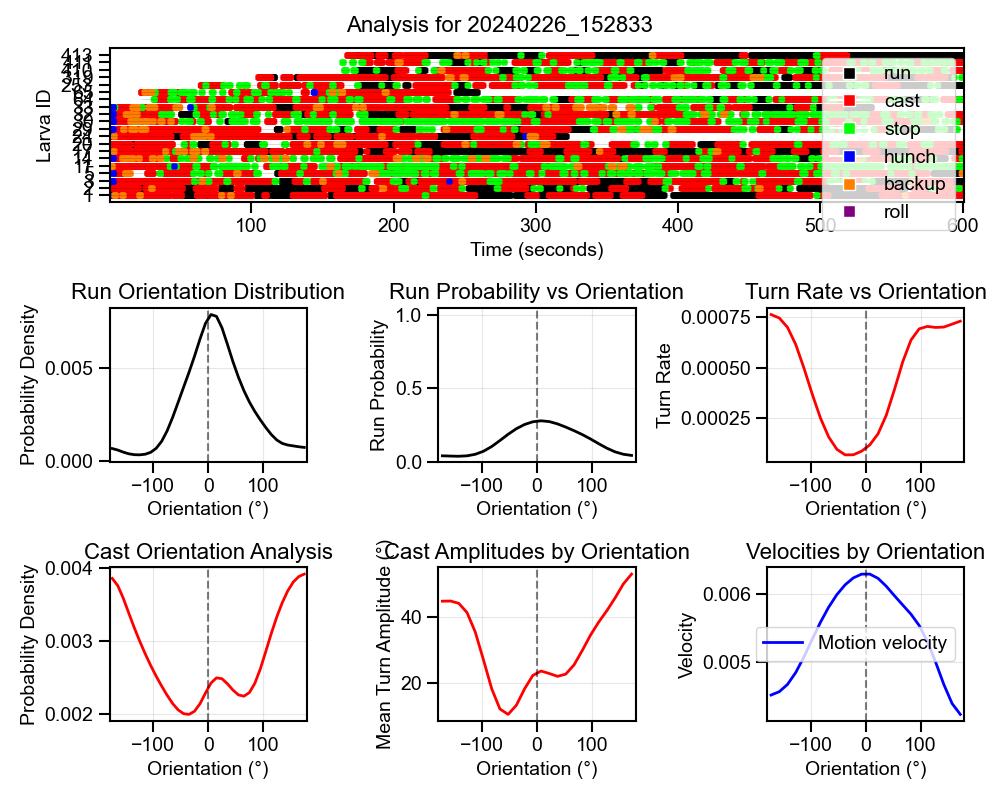

Analyzing 20240301_112859...
Saved figure to ../results/analysis/GMR_MB143B@UAS_TNT_2_0003/20240301_112859/analysis_20240301_112859.png


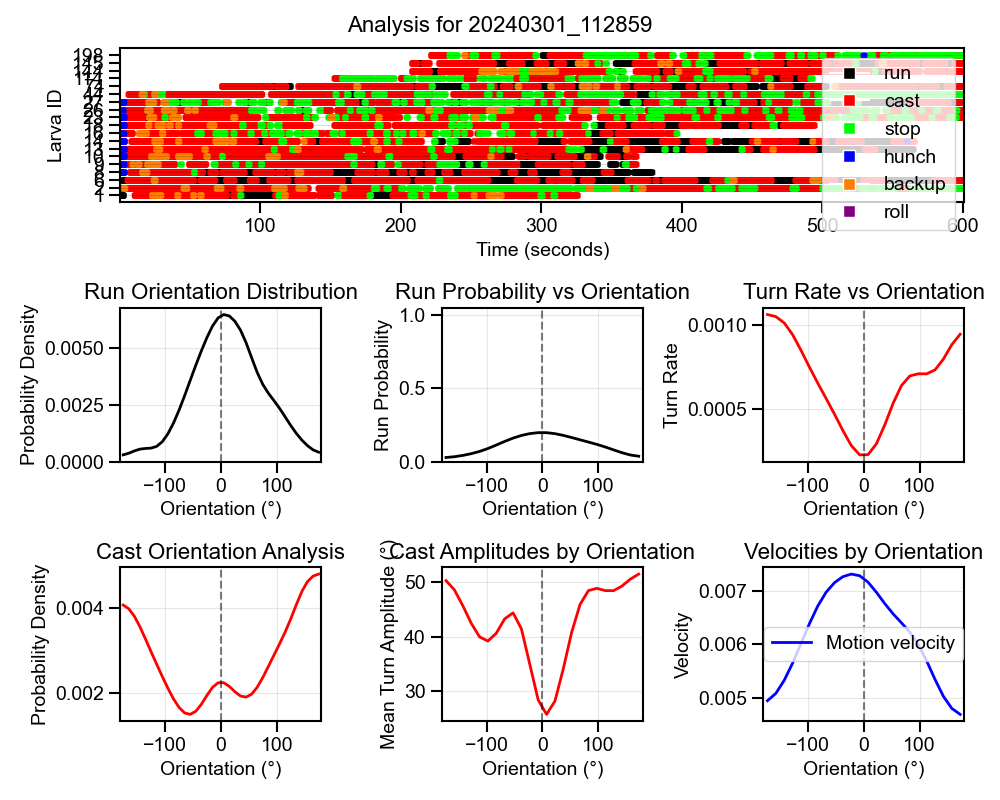

Analyzing 20240304_143024...
Saved figure to ../results/analysis/GMR_MB143B@UAS_TNT_2_0003/20240304_143024/analysis_20240304_143024.png


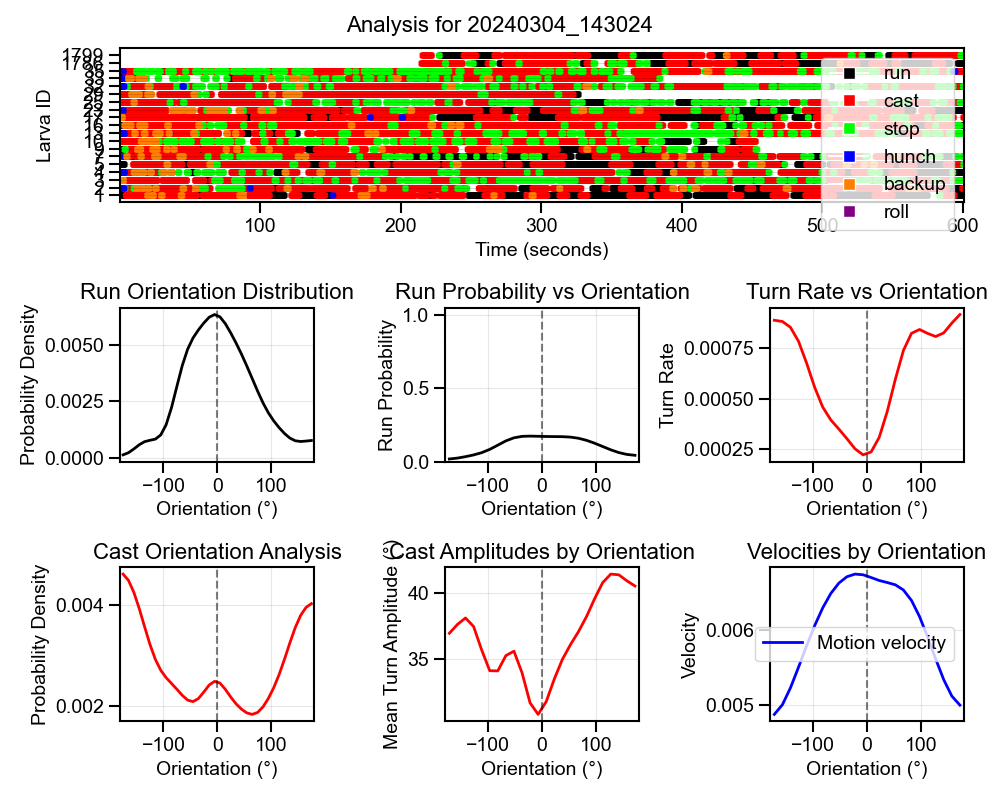

Analyzing 20240308_131239...
Saved figure to ../results/analysis/GMR_MB143B@UAS_TNT_2_0003/20240308_131239/analysis_20240308_131239.png


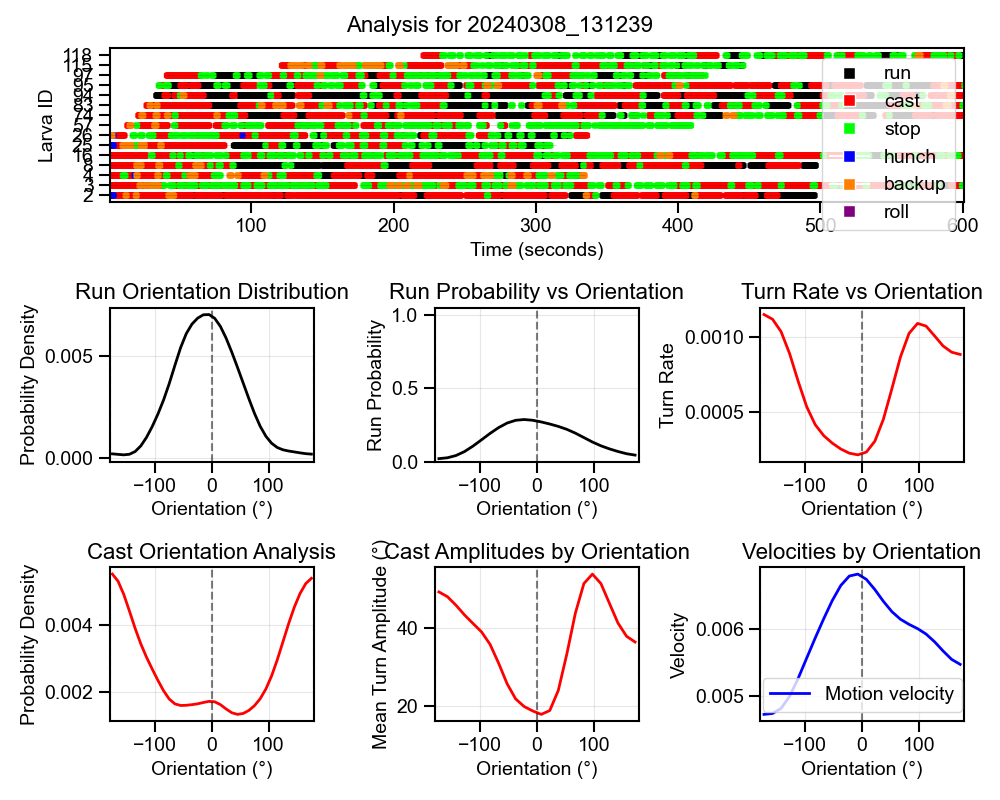

In [7]:
# Plot analysis for each date
for date_key, date_data in all_dates_data.items():
    if date_key != 'all_combined':
        analyze_date(date_data, output_dir)

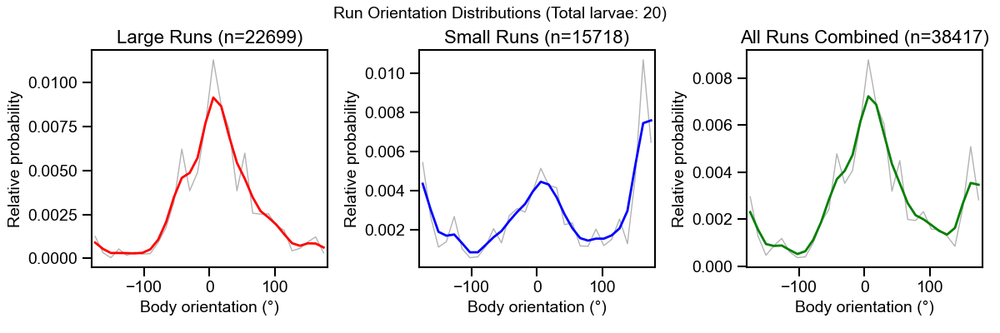

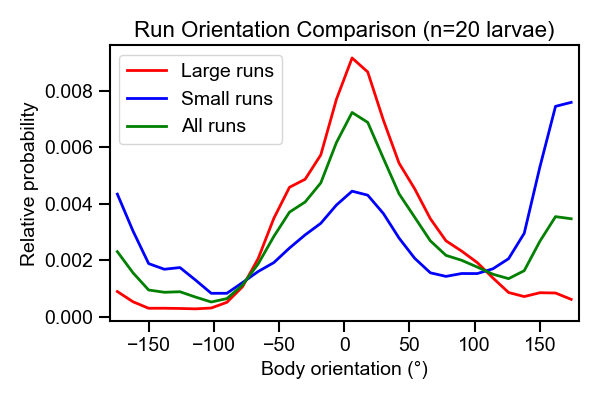

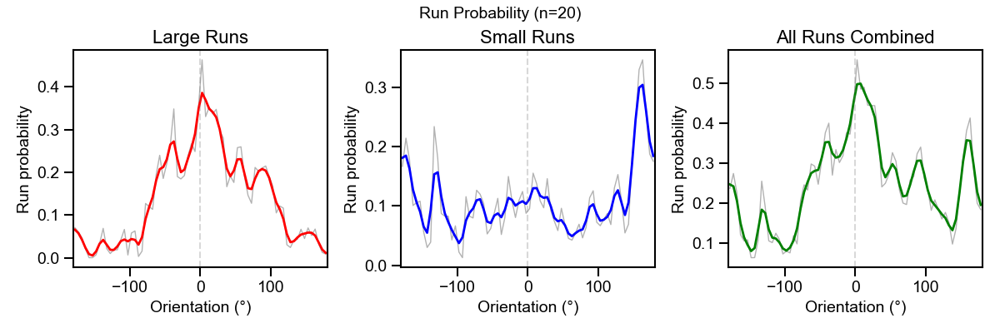

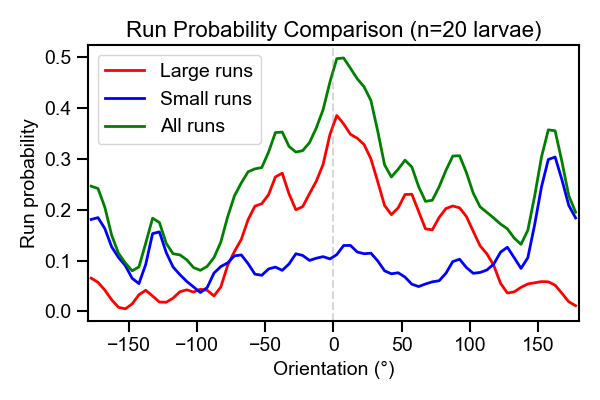

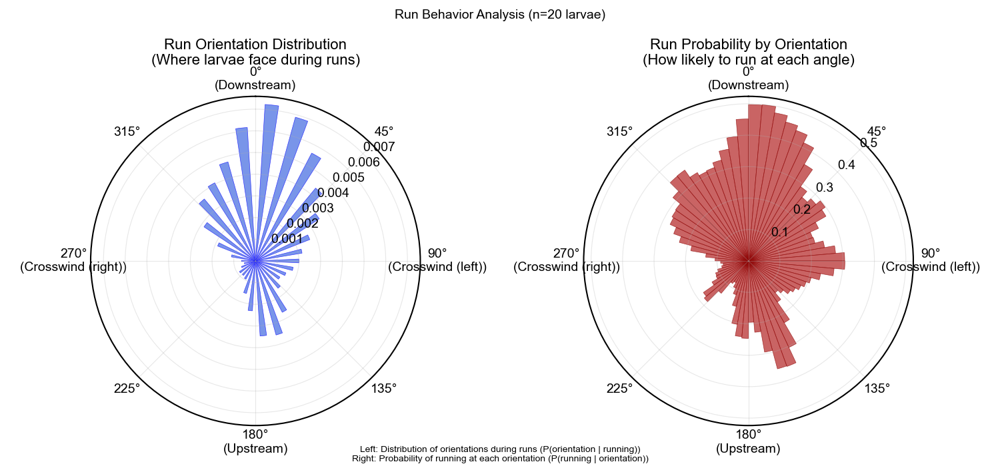

...

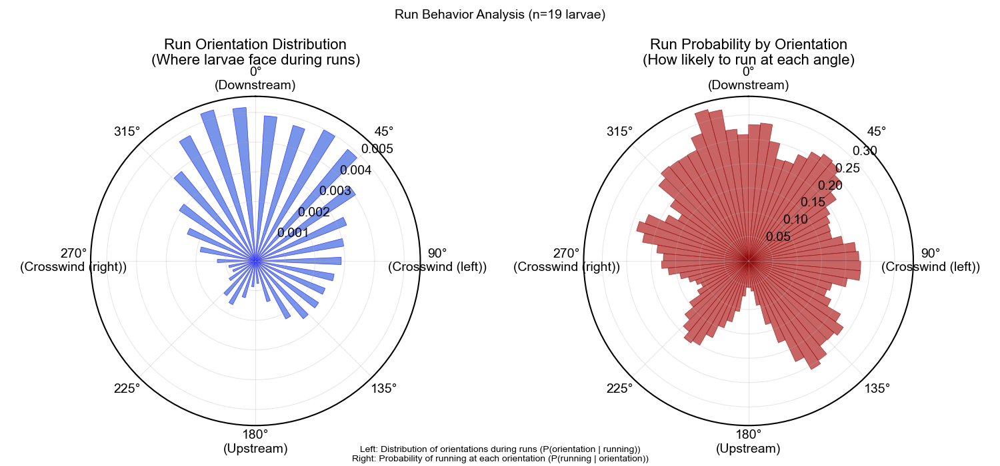

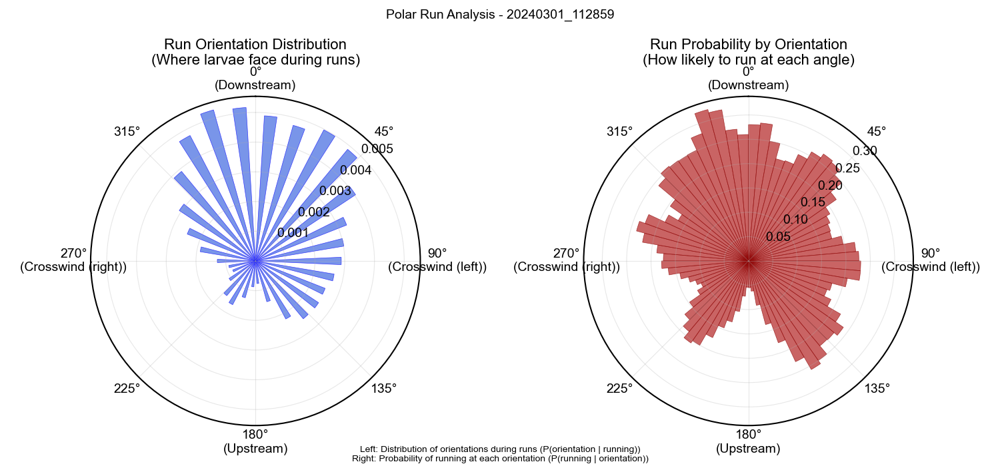

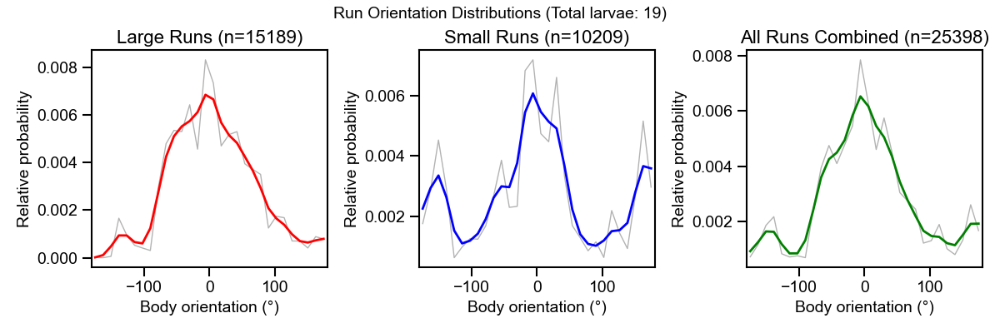

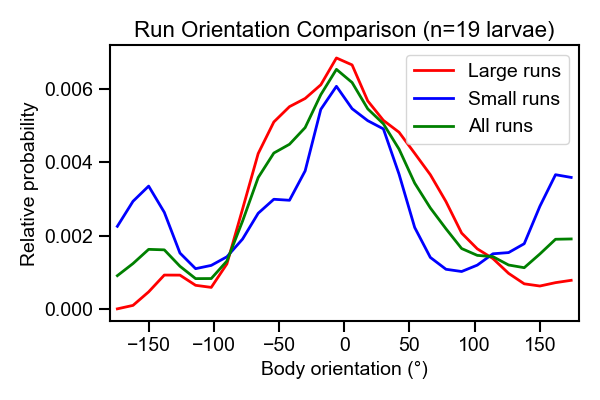

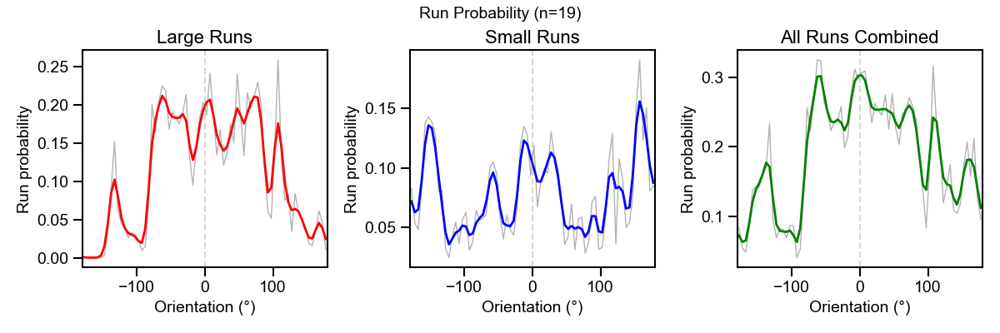

/Users/sharbat/Projects/anemotaxis/src/processor.py:8364: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(6, 4))


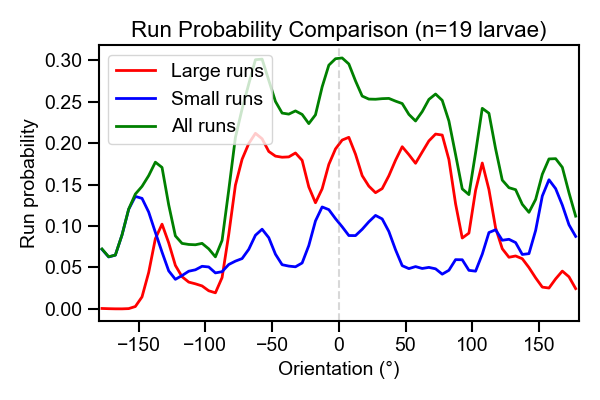

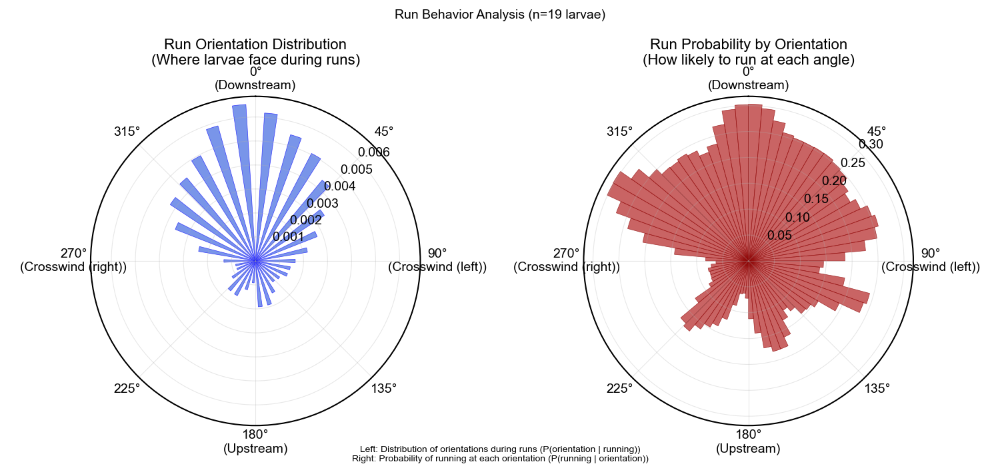

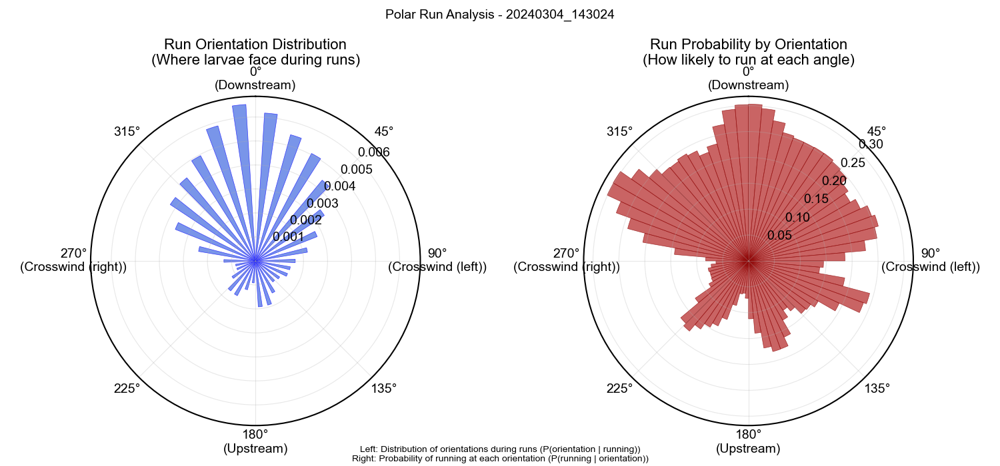

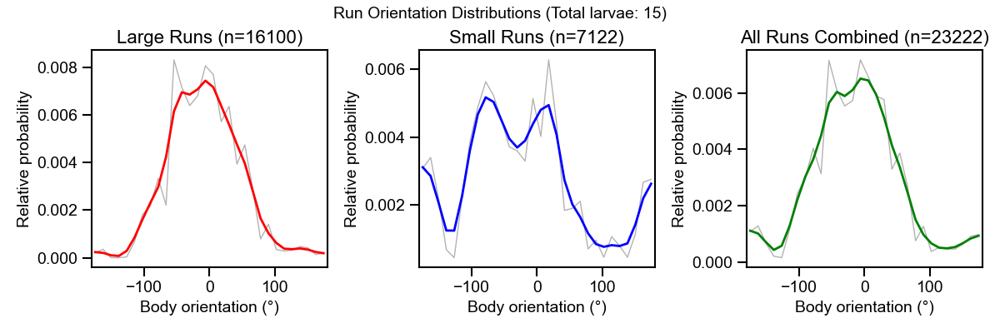

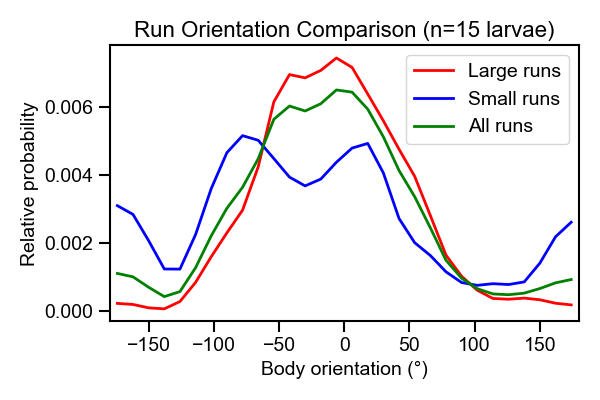

...

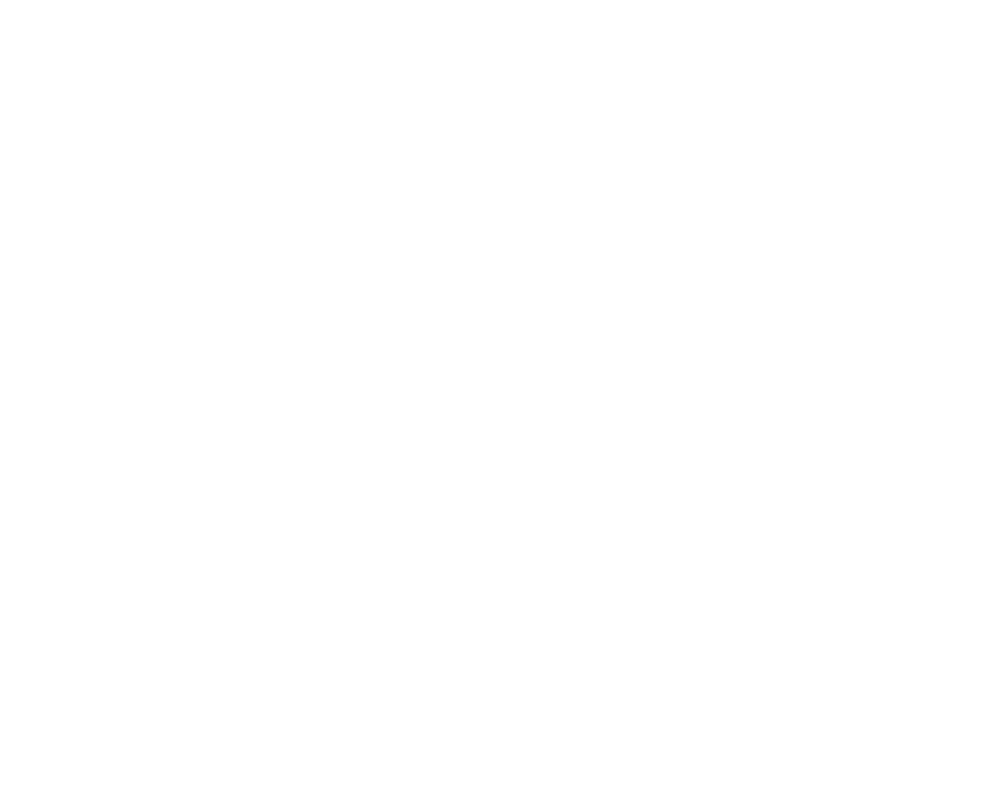

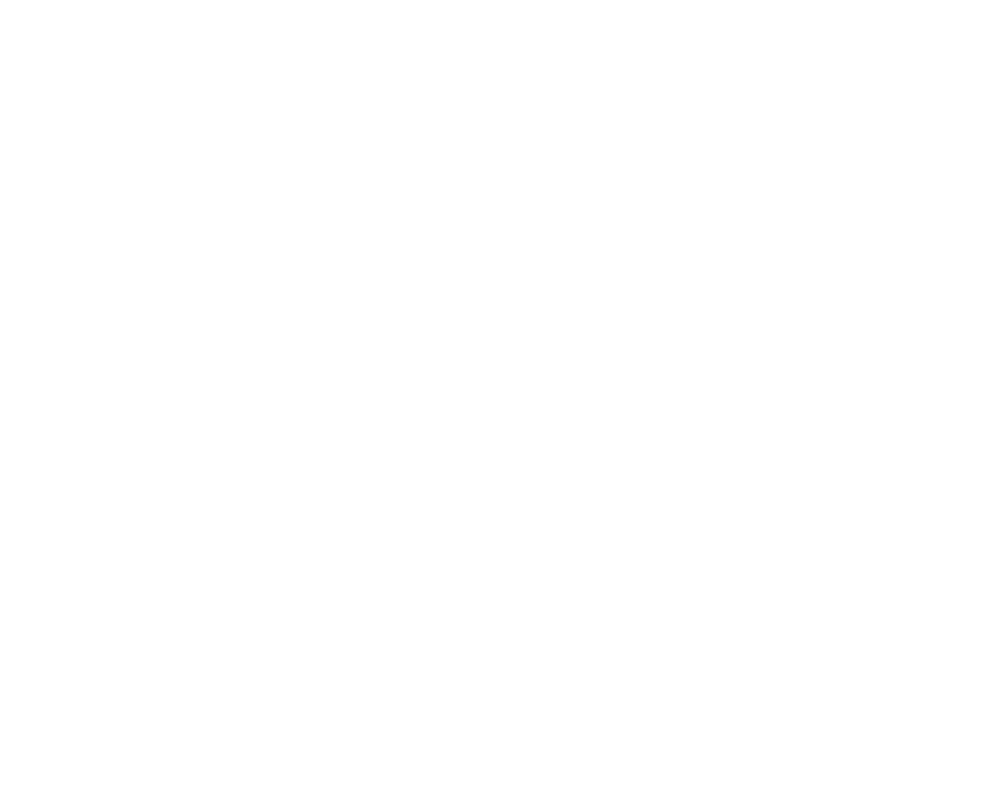

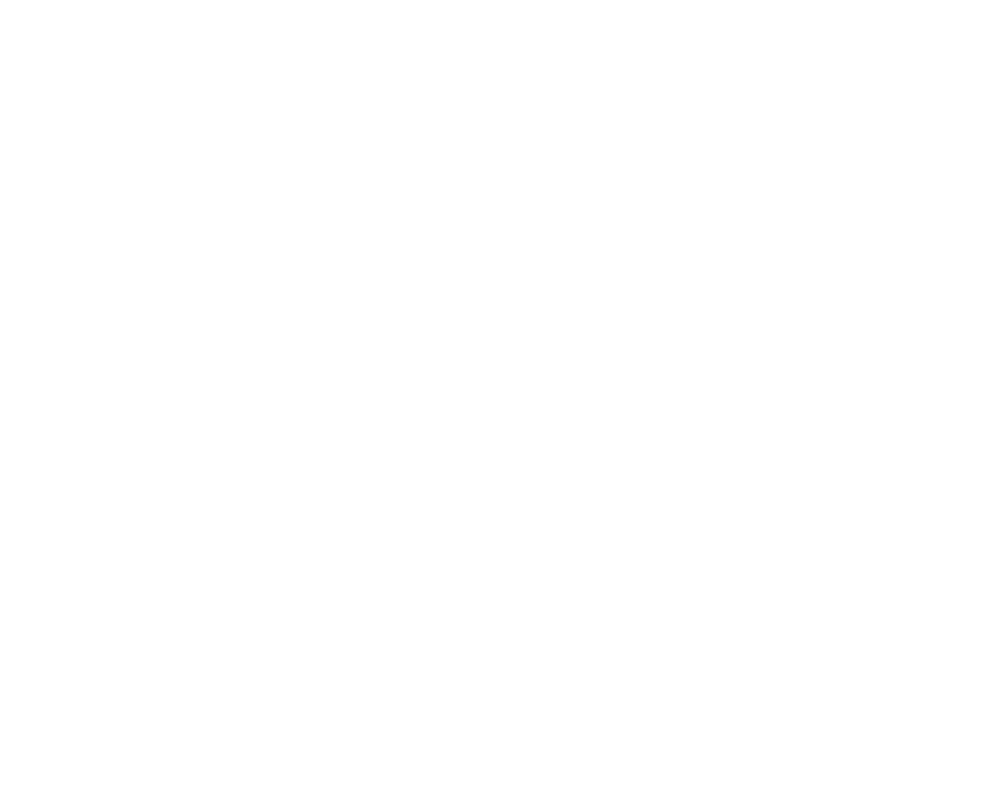

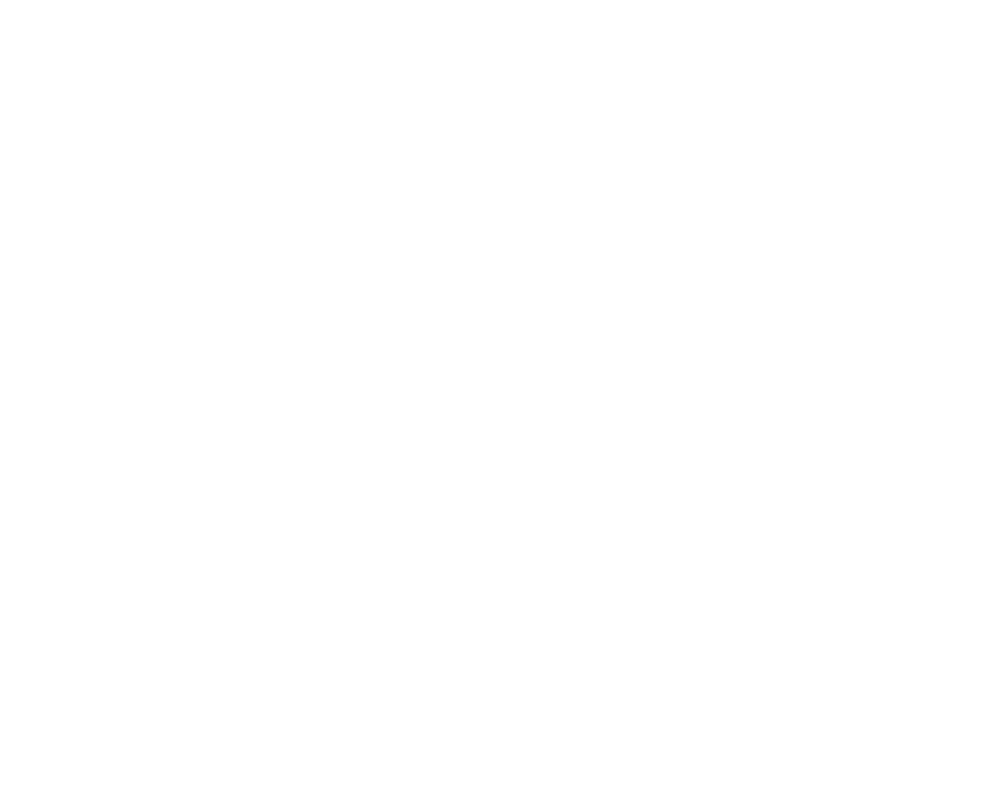

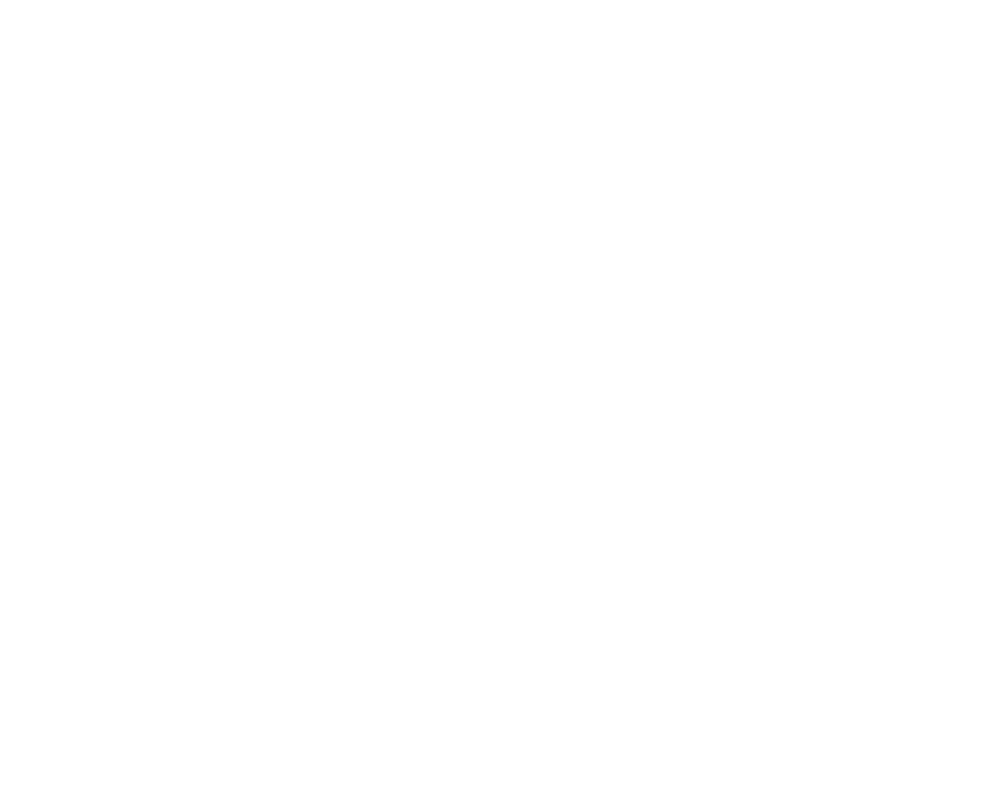

In [8]:
# Create polar run analysis plots
for date_key, date_data in all_dates_data.items():
    plt.figure(figsize=(10, 8))
    
    # Use the merged data for polar analysis
    merged_data = date_data['merged_data']
    
    # Create polar plot
    results = processor.plot_polar_run_histograms(
        merged_data, 
        bin_width=5,
        save_path=os.path.join(output_dir, f"polar_run_{date_key}.png")
    )
    
    plt.suptitle(f"Polar Run Analysis - {date_data['date_str']}", fontsize=14)
    plt.show()